In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# **Available activation functions**

In [3]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return x * (1 - x)

def linear(x):
    return x

def linear_derivative(x):
    return np.ones_like(x)

def relu(x):
    return np.maximum(0, x)

def relu_derivative(x):
    return np.where(x > 0, 1, 0)

def tanh(x):
    return np.tanh(x)

def tanh_derivative(x):
    return 1 - x**2

# **Single layer definition**

In [ ]:
class Layer:
    
    def __init__(self, input_dim, output_dim, activation='sigmoid', weights_init='uniform'):
        """
        Initializes a single layer in the neural network.

        Parameters:
        - input_dim (int): Number of input neurons (features).
        - output_dim (int): Number of output neurons.
        - activation (str, optional): Activation function to use ('sigmoid' by default). 
          Supported: 'sigmoid', 'linear', 'relu', 'tanh'.
        - weights_init (str, optional): Weight initialization method ('uniform' by default).
          Available methods:
            - 'uniform' : Weights initialized from a uniform distribution.
            - 'normal'  : Weights initialized from a normal distribution.
            - 'xavier'  : Xavier/Glorot initialization (good for tanh).
            - 'he'      : He initialization (good for ReLU).

        Raises:
        - ValueError: If an unknown weight initialization method or activation function is provided.
        """
        
        weight_initializers = {
            'uniform': lambda: np.random.uniform(0, 1, size=(input_dim, output_dim)),
            'normal': lambda: np.random.randn(input_dim, output_dim),  
            'xavier': lambda: np.random.randn(input_dim, output_dim) * np.sqrt(2 / (input_dim + output_dim)),
            'he': lambda: np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim) 
        }

        if weights_init not in weight_initializers:
            raise ValueError(f"Unknown initialization method: {weights_init}. Available: {list(weight_initializers.keys())}")

        self.weights = weight_initializers[weights_init]()
        self.biases = np.zeros((1, output_dim))
        
        activation_functions = {
            'sigmoid' : sigmoid,
            'linear' : linear,
            'relu' : relu,
            'tanh' : tanh
        }
        
        activation_derivatives = {  
            'sigmoid': sigmoid_derivative,
            'linear': linear_derivative,
            'relu' : relu_derivative,
            'tanh' : tanh_derivative
        }

        self.activation = activation_functions.get(activation)
        self.activation_derivative = activation_derivatives.get(activation)
        
        if self.activation is None:
            raise ValueError(f"Unknown activation function: {activation}. Available: {list(activation_functions.keys())}")

        
    def forward(self, X):
        """
        Performs forward propagation through the layer.

        Parameters:
        - X (numpy array): Input data (shape: number of samples × input features).

        Returns:
        - numpy array: Activated output of the layer.
        """
        return self.activation(np.dot(X, self.weights) + self.biases)


# **MLP with backpropagation definition**

In [5]:
class MLP:
    
    def __init__(self, layers, weights_init='uniform'):
        """
        Initializes the multi-layer perceptron (MLP).
        
        Parameters:
        - layers (list of dicts): Each dictionary defines a Layer object with keys:
            - 'input_dim' (int): Number of input neurons.
            - 'output_dim' (int): Number of output neurons.
            - 'activation' (str): Activation function name.
        - weights_init (str, optional): Method for weight initialization ('uniform' by default).
        """
        self.layers = [Layer(layer['input_dim'], layer['output_dim'], layer['activation'], weights_init) for layer in layers]
        self.weights_history = []


    def feedforward(self, X):
        """
        Performs forward propagation through the network.
        
        Parameters:
        - X (numpy array): Input data (shape: number of samples × input features).

        Returns:
        - activations (list of numpy arrays): Activations of each layer including input and output.
        """
        activations = [X]
        for i, layer in enumerate(self.layers):
            activations.append(layer.forward(activations[i]))
        return activations


    def predict(self, X):
        """
        Computes the network's output for given input data.
        
        Parameters:
        - X (numpy array): Input data.

        Returns:
        - numpy array: The final network output (predicted values).
        """
        return np.array(self.feedforward(X)[-1]).reshape(-1,)


    def train(self, X_train, y_train, epochs=500, learning_rate=0.1, batch_size=None):
        """
        Trains the neural network using mini-batch gradient descent and backpropagation.

        Parameters:
        - X_train (numpy array): Training input data.
        - y_train (numpy array): Training target values.
        - epochs (int, optional): Number of training iterations (default is 500).
        - learning_rate (float, optional): Step size for weight updates (default is 0.1).
        - batch_size (int, optional): Number of samples per batch. If None, full-batch is used.

        Returns:
        - None (prints training progress and plots weight evolution).
        """
        X_train = np.array(X_train)
        y_train = np.array(y_train)
        mses = []
        self.weights_history = []

        if batch_size is None:
            batch_size = len(X_train)  

        for epoch in range(epochs):
            indices = np.arange(len(X_train))
            np.random.shuffle(indices)  

            for i in range(0, len(X_train), batch_size):
                batch_indices = indices[i:i + batch_size]  
                X_batch = X_train[batch_indices]
                y_batch = y_train[batch_indices].reshape(-1, 1)

                weights_error = [np.zeros_like(layer.weights) for layer in self.layers]
                biases_error = [np.zeros_like(layer.biases) for layer in self.layers]

                activations = self.feedforward(X_batch)

                weights_error, biases_error = self.backpropagate(activations, y_batch)

                for j, layer in enumerate(self.layers):
                    layer.weights -= learning_rate * weights_error[j]
                    layer.biases -= learning_rate * biases_error[j]

            self.weights_history.append([layer.weights.copy() for layer in self.layers])

            y_pred = self.predict(X_train)
            tmp_mse = self.mse(y_pred, y_train)
            print(f"\nEpoch {epoch + 1}/{epochs}. MSE = {tmp_mse}")
            mses.append(tmp_mse)
        
        plt.figure()
        plt.plot(range(epochs), mses, 'o')
        plt.show()
        self.plot_weights_evolution()


    def plot_weights_evolution(self):
        """
        Plots the evolution of weights over epochs for each layer.

        Returns:
        - None (displays plots).
        """
        epochs = len(self.weights_history)
        for layer_idx in range(len(self.layers)):
            weights_per_epoch = np.array([epoch[layer_idx] for epoch in self.weights_history])  
            
            num_weights = weights_per_epoch[0].size  
            weights_per_epoch = weights_per_epoch.reshape(epochs, num_weights)

            plt.figure(figsize=(8, 5))
            for w in range(num_weights):
                plt.plot(range(epochs), weights_per_epoch[:, w], label=f'Weight {w}', alpha=0.7)

            plt.title(f'Weight Evolution in Layer {layer_idx + 1}')
            plt.xlabel('Epoch')
            plt.ylabel('Weight Value')
            plt.legend()
            plt.show()                   
    
    
    def backpropagate(self, activations, y_batch):
        """
        Performs backpropagation to compute gradients for weight and bias updates.

        Parameters:
        - activations (list of numpy arrays): Activations from feedforward pass.
        - y_batch (numpy array): Expected output.

        Returns:
        - Tuple (weight_gradients, bias_gradients) where:
            - weight_gradients (list of numpy arrays): Gradients for each layer’s weights.
            - bias_gradients (list of numpy arrays): Gradients for each layer’s biases.
        """
        
        batch_size = y_batch.shape[0]

        y_pred = activations[-1]  
        error = (y_pred - y_batch).reshape(-1, 1)
        
        deltas = [error * self.layers[-1].activation_derivative(y_pred)]

        for i in range(len(self.layers) - 2, -1, -1):
            layer = self.layers[i]
            next_layer = self.layers[i + 1]
            
            error = deltas[-1] @ next_layer.weights.T  
            deltas.append(error * layer.activation_derivative(activations[i + 1]))

        deltas.reverse() 

        weight_gradients = [(activations[i].T @ deltas[i]) / batch_size for i in range(len(self.layers))]
        bias_gradients = [np.mean(deltas[i], axis=0, keepdims=True) for i in range(len(self.layers))]

        return weight_gradients, bias_gradients
    
   
    def set_weights_and_biases(self, layer_idx, W, b):
        """
        Sets custom weights and biases for a specific layer.

        Parameters:
        - layer_idx (int): Index of the layer (0-based).
        - W (numpy array): New weight matrix for the layer.
        - b (numpy array): New bias vector for the layer.

        Returns:
        - None
        """
        self.layers[layer_idx].weights = W
        self.layers[layer_idx].biases = b


    def mse(self, y_true, y_pred):
        """
        Computes the Mean Squared Error (MSE) loss.

        Parameters:
        - y_true (numpy array): True target values.
        - y_pred (numpy array): Predicted values from the network.

        Returns:
        - float: Computed MSE loss.
        """
        return np.mean((y_true - y_pred) ** 2)


## **Square-simple dataset**


Epoch 1/120000. MSE = 10358.903525608328

Epoch 2/120000. MSE = 10334.1264863007

Epoch 3/120000. MSE = 10310.557529582864

Epoch 4/120000. MSE = 10288.108331542908

Epoch 5/120000. MSE = 10266.697573061527

Epoch 6/120000. MSE = 10246.25028975571

Epoch 7/120000. MSE = 10226.69728815087

Epoch 8/120000. MSE = 10207.974620937455

Epoch 9/120000. MSE = 10190.023114950403

Epoch 10/120000. MSE = 10172.787946209866

Epoch 11/120000. MSE = 10156.218256986282

Epoch 12/120000. MSE = 10140.26681041001

Epoch 13/120000. MSE = 10124.889678641066

Epoch 14/120000. MSE = 10110.045961055097

Epoch 15/120000. MSE = 10095.697529292625

Epoch 16/120000. MSE = 10081.808796365263

Epoch 17/120000. MSE = 10068.34650731995

Epoch 18/120000. MSE = 10055.2795492342

Epoch 19/120000. MSE = 10042.578778556044

Epoch 20/120000. MSE = 10030.216864015218

Epoch 21/120000. MSE = 10018.168143520272

Epoch 22/120000. MSE = 10006.408493622408

Epoch 23/120000. MSE = 9994.915210273566

Epoch 24/120000. MSE = 9983.

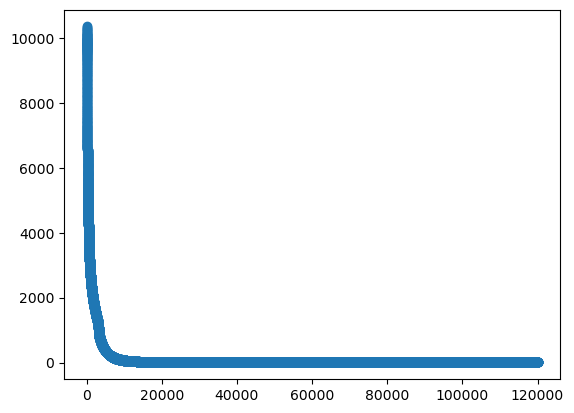

c:\Users\flang\anaconda3\envs\miowad\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


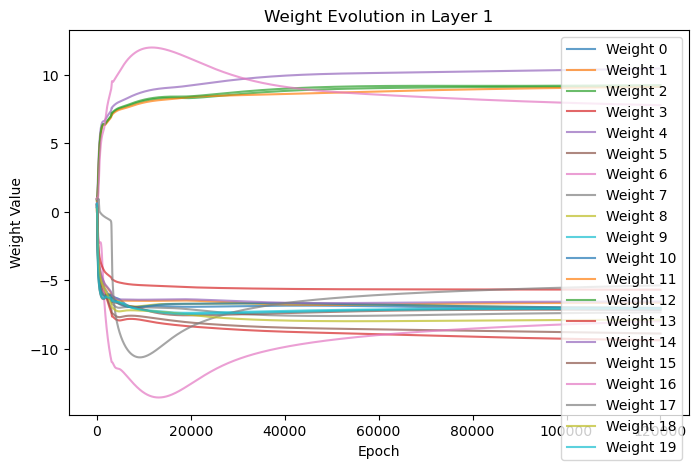

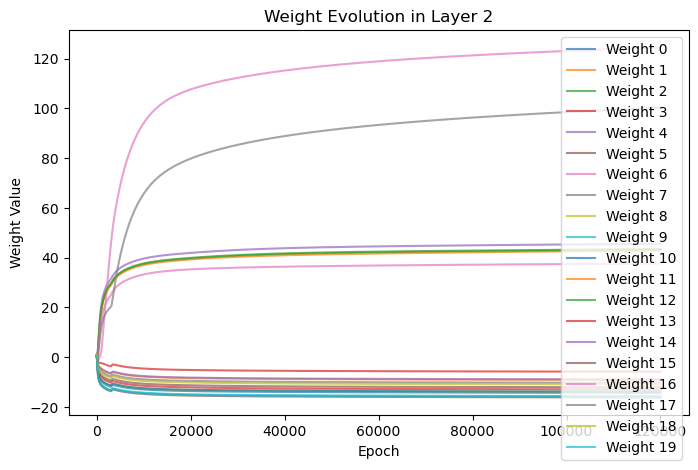

TRAIN MSE = 1.3276979668856685
TEST MSE = 2.2589804633740136


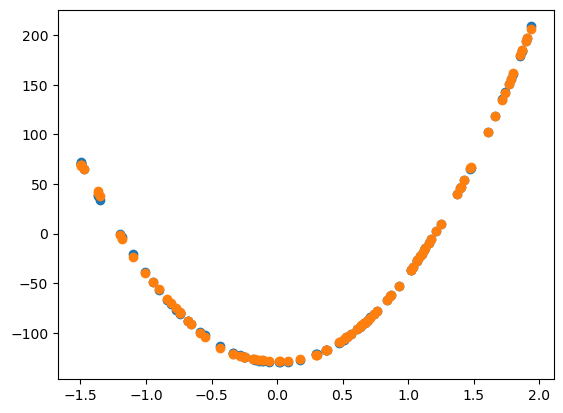

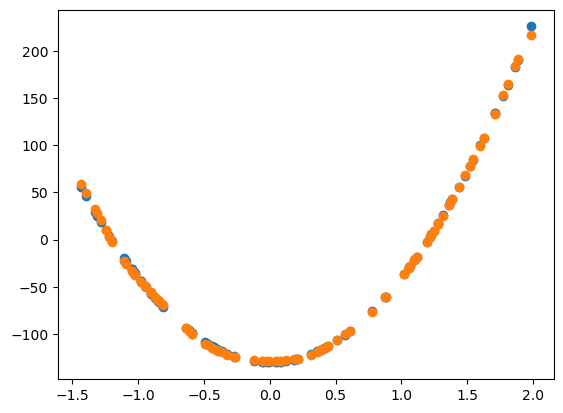

In [6]:
np.random.seed(423)

square_simple_train = pd.read_csv('./data/regression/square-simple-training.csv')
square_simple_train.drop(square_simple_train.columns[0], axis = 1, inplace = True)

X = square_simple_train.iloc[:, 0:(len(square_simple_train.iloc[1]) - 1)]
y = np.array(square_simple_train.iloc[:,-1])

NN = MLP(layers=[
    {'input_dim' : 1, 'output_dim' : 20, 'activation' : 'sigmoid'},
    {'input_dim' : 20, 'output_dim' : 1, 'activation' : 'linear'}
], 
                   weights_init='uniform')

NN.train(X, y, epochs=120000, learning_rate=0.002, batch_size = 100)

y_pred = NN.predict(X)
plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TRAIN MSE = {NN.mse(y_pred, y)}")

square_simple_test = pd.read_csv('./data/regression/square-simple-test.csv')
square_simple_test.drop(square_simple_test.columns[0], axis = 1, inplace = True)

X = square_simple_test.iloc[:, 0:(len(square_simple_test.iloc[1]) - 1)]

y = np.array(square_simple_test['y'])

y_pred = NN.predict(X)

plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TEST MSE = {NN.mse(y_pred, y)}")



# **Steps-small dataset**


Epoch 1/60000. MSE = 5701.899106234831

Epoch 2/60000. MSE = 4474.925851674822

Epoch 3/60000. MSE = 3686.3020462735044

Epoch 4/60000. MSE = 3155.4709396611324

Epoch 5/60000. MSE = 2832.0125124416254

Epoch 6/60000. MSE = 2871.7775156377797

Epoch 7/60000. MSE = 3575.615657262675

Epoch 8/60000. MSE = 2303.311982346428

Epoch 9/60000. MSE = 2105.4964859475535

Epoch 10/60000. MSE = 1984.3380736934912

Epoch 11/60000. MSE = 1918.7686410551441

Epoch 12/60000. MSE = 2092.183993444882

Epoch 13/60000. MSE = 2056.4831318065794

Epoch 14/60000. MSE = 2159.286593940267

Epoch 15/60000. MSE = 2339.9065143019343

Epoch 16/60000. MSE = 1556.3840239215021

Epoch 17/60000. MSE = 1372.6183614344025

Epoch 18/60000. MSE = 1253.8393503472469

Epoch 19/60000. MSE = 1181.2609174256947

Epoch 20/60000. MSE = 1115.8730990324316

Epoch 21/60000. MSE = 1060.6463622158972

Epoch 22/60000. MSE = 1011.9580133358281

Epoch 23/60000. MSE = 968.0147848054304

Epoch 24/60000. MSE = 922.4200647575018

Epoch 25

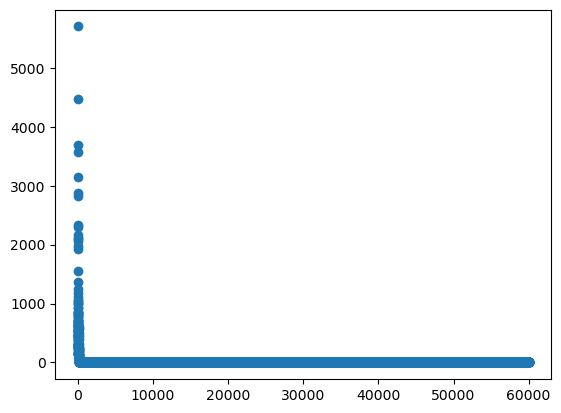

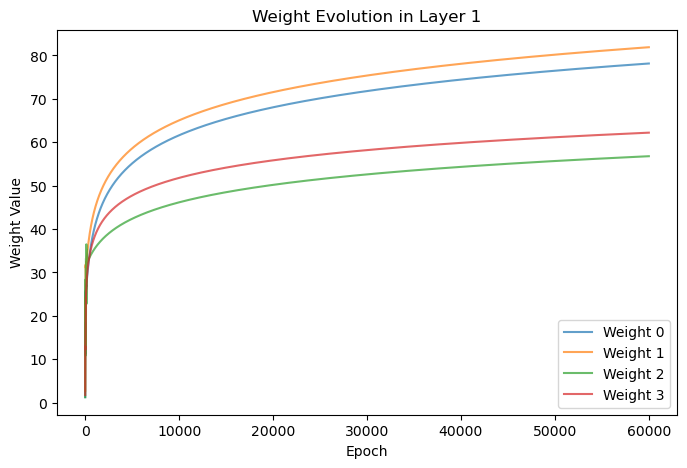

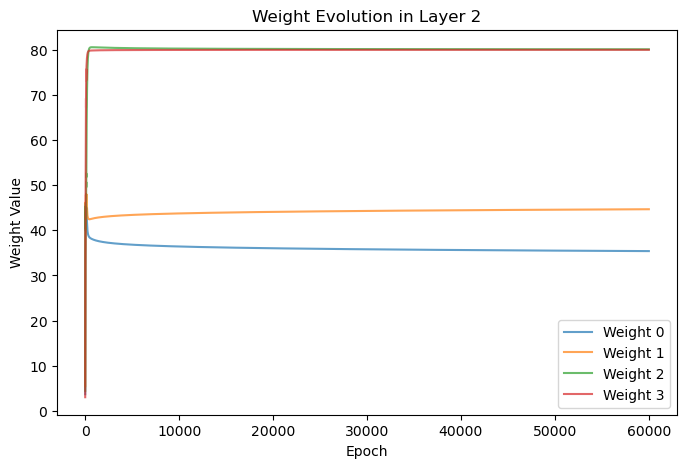

TRAIN MSE = 0.06394917974933745
TEST MSE = 88.80559994456716


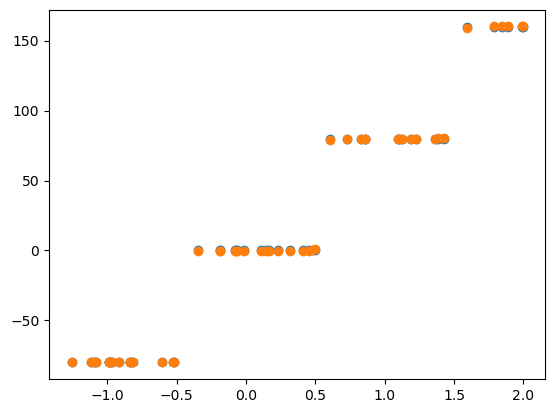

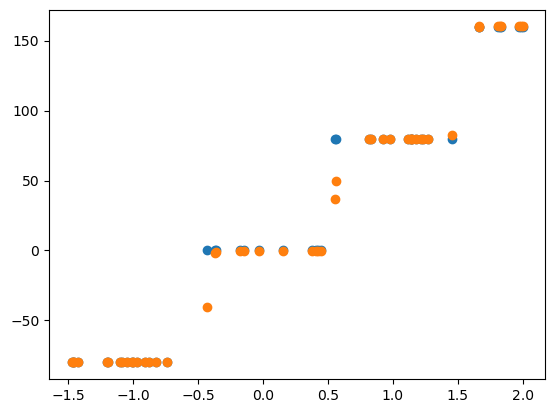

In [7]:
np.random.seed(23)
steps_small_train = pd.read_csv('./data/regression/steps-small-training.csv')
steps_small_train.drop(steps_small_train.columns[0], axis = 1, inplace = True)

X = steps_small_train.iloc[:, 0:(len(steps_small_train.iloc[1]) - 1)]

y = np.array(steps_small_train['y'])

NN = MLP(layers=[
    {'input_dim' : 1, 'output_dim' : 4, 'activation' : 'sigmoid'},
    {'input_dim' : 4, 'output_dim' : 1, 'activation' : 'linear'}
], 
                   weights_init='uniform')

NN.train(X, y, epochs=60000, learning_rate=0.2, batch_size = 100)

y_pred = NN.predict(X)
plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TRAIN MSE = {NN.mse(y_pred, y)}")

steps_small_test = pd.read_csv('./data/regression/steps-small-test.csv')
steps_small_test.drop(steps_small_test.columns[0], axis = 1, inplace = True)

X = steps_small_test.iloc[:, 0:(len(steps_small_test.iloc[1]) - 1)]

y = np.array(steps_small_test['y'])

y_pred = NN.predict(X)

plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TEST MSE = {NN.mse(y_pred, y)}")

The training set has a different distribution of values on the x-axis, making it impossible to perfectly predict the values in the test set.

# **Multimodal-large dataset**


Epoch 1/600. MSE = 3098.252384145477

Epoch 2/600. MSE = 2564.188643668494

Epoch 3/600. MSE = 2084.0413309923624

Epoch 4/600. MSE = 1720.7569924561512

Epoch 5/600. MSE = 1506.4646429857048

Epoch 6/600. MSE = 1355.4125074723427

Epoch 7/600. MSE = 1249.5174389691495

Epoch 8/600. MSE = 1186.5821422771835

Epoch 9/600. MSE = 1136.767977969234

Epoch 10/600. MSE = 1093.260586727261

Epoch 11/600. MSE = 1067.4864712312701

Epoch 12/600. MSE = 1037.1873592224576

Epoch 13/600. MSE = 1011.4663867835685

Epoch 14/600. MSE = 989.3974890688276

Epoch 15/600. MSE = 972.3948550837271

Epoch 16/600. MSE = 957.4093302086081

Epoch 17/600. MSE = 940.8059739263764

Epoch 18/600. MSE = 929.9945724692125

Epoch 19/600. MSE = 930.9270844030067

Epoch 20/600. MSE = 922.38145988712

Epoch 21/600. MSE = 904.2189123048485

Epoch 22/600. MSE = 883.1643726101943

Epoch 23/600. MSE = 756.5022504021533

Epoch 24/600. MSE = 700.6473270253774

Epoch 25/600. MSE = 650.1768131891456

Epoch 26/600. MSE = 610.41

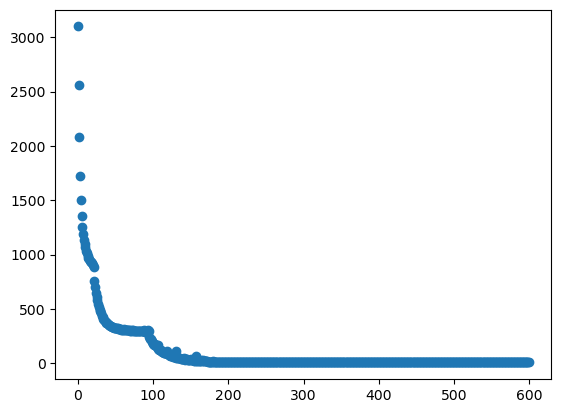

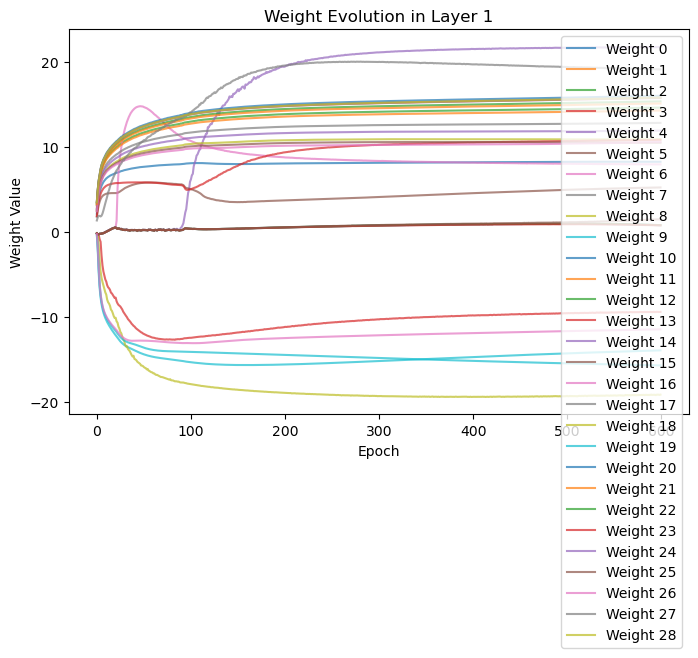

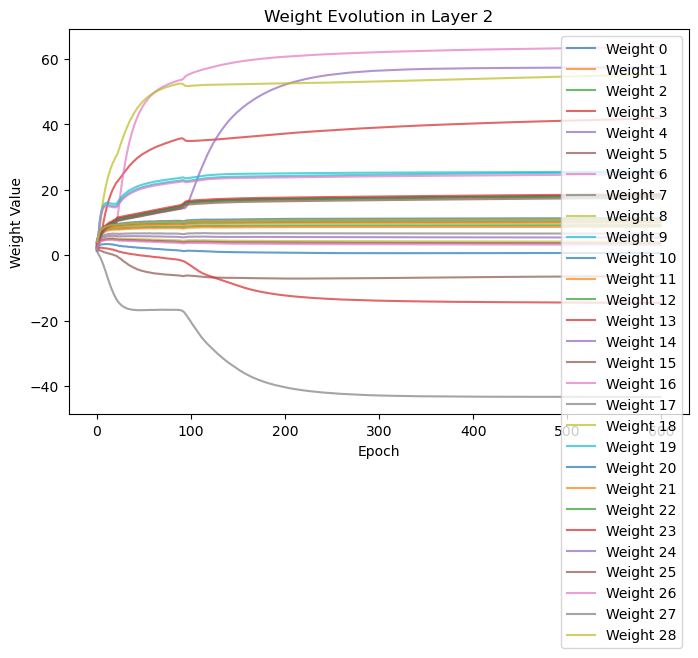

TRAIN MSE = 8.06491650040556
TEST MSE = 3.006926668875326


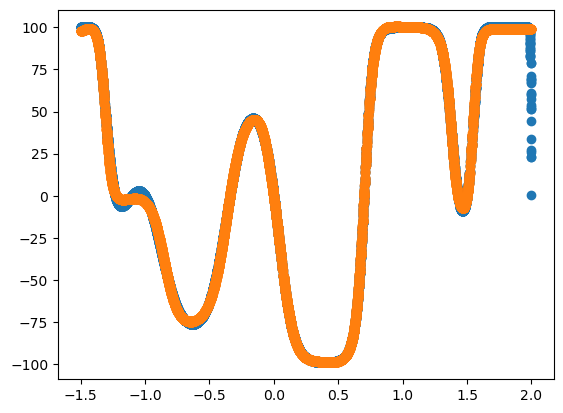

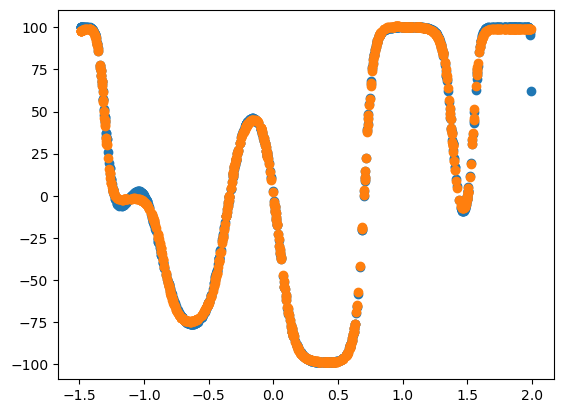

In [8]:
np.random.seed(23)
multimodal_large_train = pd.read_csv('./data/regression/multimodal-large-training.csv')
X = np.array(multimodal_large_train['x']).reshape(-1, 1)
y = np.array(multimodal_large_train['y'])

NN = MLP(layers=[
    {'input_dim' : 1, 'output_dim' : 29, 'activation' : 'tanh'},
    {'input_dim' : 29, 'output_dim' : 1, 'activation' : 'linear'}
], 
                   weights_init='uniform')

NN.train(X, y, epochs=600, learning_rate=0.005, batch_size = 120)

y_pred = NN.predict(X)
plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TRAIN MSE = {NN.mse(y_pred, y)}")

multimodal_large_test = pd.read_csv('./data/regression/multimodal-large-test.csv')
X = np.array(multimodal_large_test['x']).reshape(-1, 1)
y = np.array(multimodal_large_test['y'])

y_pred = NN.predict(X)
plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TEST MSE = {NN.mse(y_pred, y)}")

# **Multimodal-large dataset** - one batch

It learns much, much slower as we can see below.


Epoch 1/30000. MSE = 4976.83493708654

Epoch 2/30000. MSE = 4925.85018803177

Epoch 3/30000. MSE = 4878.962981209721

Epoch 4/30000. MSE = 4835.5244773473505

Epoch 5/30000. MSE = 4794.937100922943

Epoch 6/30000. MSE = 4756.744041053788

Epoch 7/30000. MSE = 4720.60617863128

Epoch 8/30000. MSE = 4686.2665862348795

Epoch 9/30000. MSE = 4653.524698347074

Epoch 10/30000. MSE = 4622.218423260264

Epoch 11/30000. MSE = 4592.210579114404

Epoch 12/30000. MSE = 4563.377726946024

Epoch 13/30000. MSE = 4535.600770315248

Epoch 14/30000. MSE = 4508.757251094022

Epoch 15/30000. MSE = 4482.715358706551

Epoch 16/30000. MSE = 4457.3296029543835

Epoch 17/30000. MSE = 4432.4381466872055

Epoch 18/30000. MSE = 4407.8621329689695

Epoch 19/30000. MSE = 4383.408026246781

Epoch 20/30000. MSE = 4358.8748449645

Epoch 21/30000. MSE = 4334.0685324211445

Epoch 22/30000. MSE = 4308.824182021859

Epoch 23/30000. MSE = 4283.031927889895

Epoch 24/30000. MSE = 4256.6555200276125

Epoch 25/30000. MSE = 

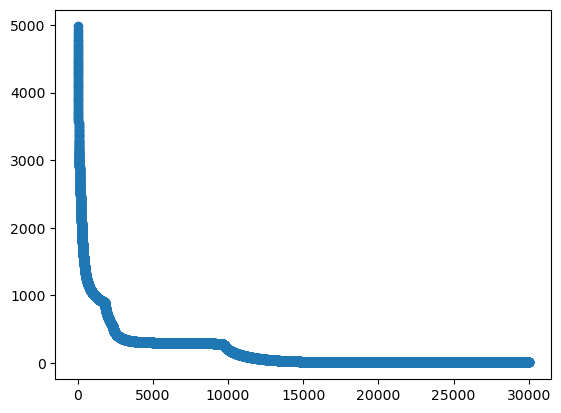

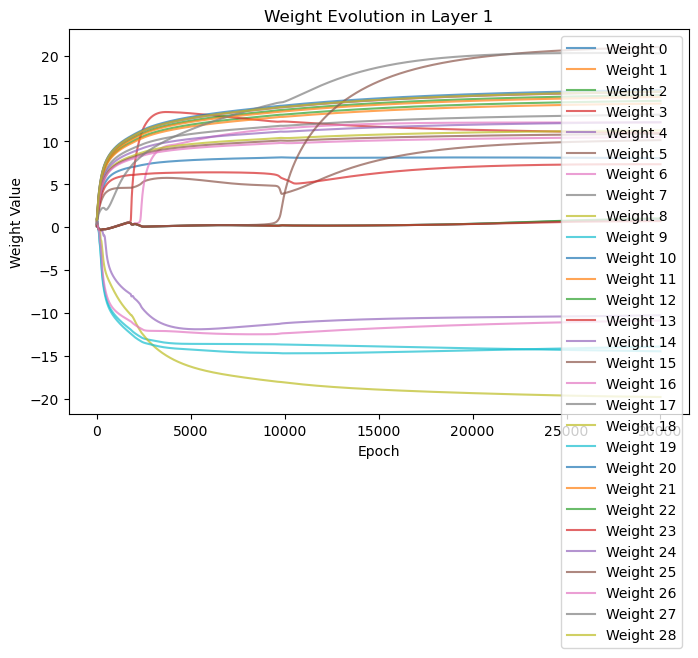

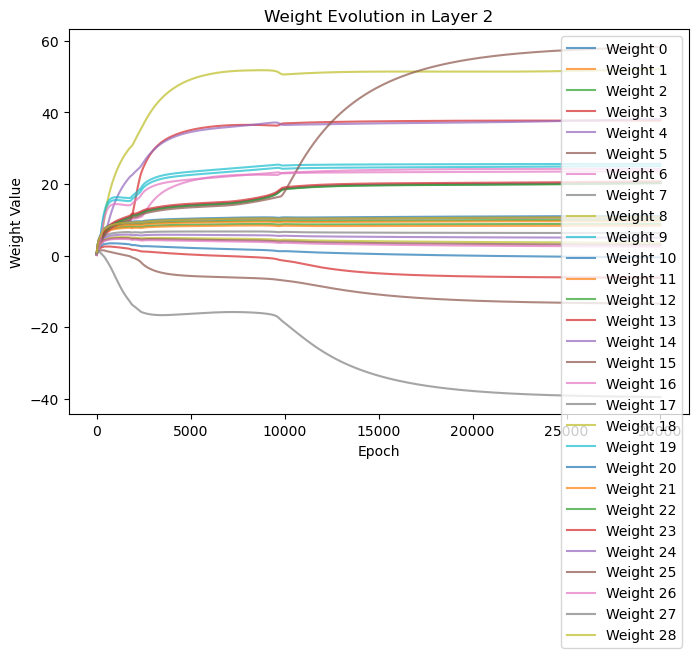

TRAIN MSE = 8.252847512039889
TEST MSE = 3.1679614911161305


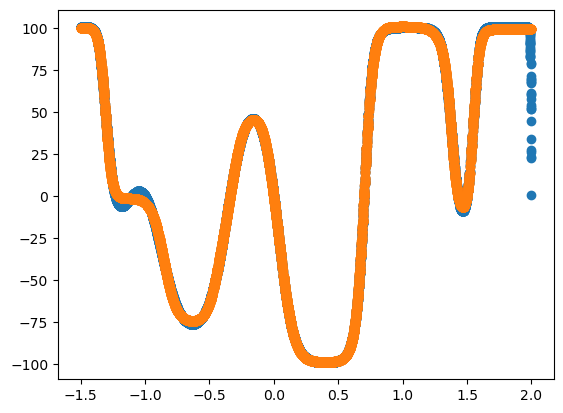

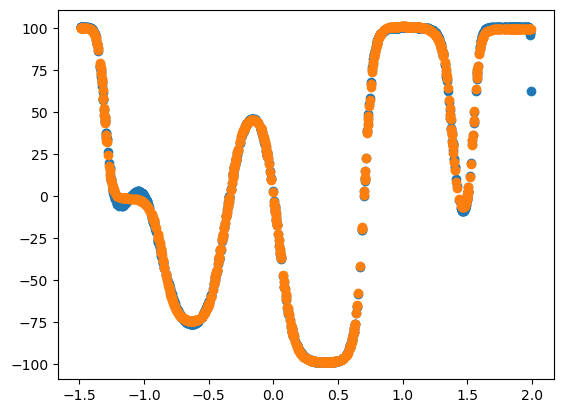

In [12]:
np.random.seed(23)
multimodal_large_train = pd.read_csv('./data/regression/multimodal-large-training.csv')
X = np.array(multimodal_large_train['x']).reshape(-1, 1)
y = np.array(multimodal_large_train['y'])

NN = MLP(layers=[
    {'input_dim' : 1, 'output_dim' : 29, 'activation' : 'tanh'},
    {'input_dim' : 29, 'output_dim' : 1, 'activation' : 'linear'}
], 
                   weights_init='uniform')

NN.train(X, y, epochs=30000, learning_rate=0.005, batch_size = len(X))

y_pred = NN.predict(X)
plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TRAIN MSE = {NN.mse(y_pred, y)}")

multimodal_large_test = pd.read_csv('./data/regression/multimodal-large-test.csv')
X = np.array(multimodal_large_test['x']).reshape(-1, 1)
y = np.array(multimodal_large_test['y'])

y_pred = NN.predict(X)
plt.figure()
plt.plot(X, y, 'o')
plt.plot(X, y_pred, 'o')
plt.show
print(f"TEST MSE = {NN.mse(y_pred, y)}")